In [1]:
# from sympy import ntt, intt
from sympy.utilities.iterables import ibin, iterable
from sympy.utilities.misc import as_int
from sympy.ntheory import isprime, primitive_root

def number_theoretic_transform(seq, prime, inverse=False, log=True):
    """Utility function for the Number Theoretic Transform"""

    if not iterable(seq):
        raise TypeError("Expected a sequence of integer coefficients "
                        "for Number Theoretic Transform")

    p = as_int(prime)
    if not isprime(p):
        raise ValueError("Expected prime modulus for "
                        "Number Theoretic Transform")

    a = [as_int(x) % p for x in seq]

    n = len(a)
    if n < 1:
        return a

    b = n.bit_length() - 1
    if n&(n - 1):
        b += 1
        n = 2**b

    if (p - 1) % n:
        raise ValueError("Expected prime modulus of the form (m*2**k + 1)")

    a += [0]*(n - len(a))
    for i in range(1, n):
        j = int(ibin(i, b, str=True)[::-1], 2)
        #print("j: ", j)
        if i < j:
            a[i], a[j] = a[j], a[i]
    
    pr = primitive_root(p)
    
    rt = pow(pr, (p - 1) // n, p)
    
    if inverse:
        rt = pow(rt, p - 2, p)

    w = [1]*(n // 2)
    for i in range(1, n // 2):
        w[i] = w[i - 1]*rt % p
    if log:
        print("RT", rt)
        print("Primitive_root:", pr)
        print('After switch a:', a)
        print("W: ",w)
    h = 2
    while h <= n:
        hf, ut = h // 2, n // h
        for i in range(0, n, h):
            for j in range(hf):
                if log:print("a in iteration", a)
                u, v = a[i + j], a[i + j + hf]*w[ut * j]
                
                a[i + j], a[i + j + hf] = (u + v) % p, (u - v) % p
                if log:print("Operating a{} = (a{} + a{}w{})mod p = {}".format((i+j),(i+j),(i+j+hf),(ut*j),a[i+j]))
                if log:print("Operating a{} = (a{} - a{}w{})mod p = {}".format((i+j+hf),(i+j),(i+j+hf),(ut*j),a[i+j+hf]))
                
        h *= 2
    
    if inverse:
        rv = pow(n, p - 2, p)
        a = [x*rv % p for x in a]

    return a



In [2]:

# sequence
seq = [15, 21, 13, 44, 17]

prime_no = 257

print("P:", prime_no)
print("Original Sequence: ",seq)
# ntt
ntt_seq = number_theoretic_transform(seq, prime_no)
print("NTT : ", ntt_seq)

inv_ntt_seq = number_theoretic_transform(ntt_seq, prime_no, inverse=True)
#intt_seq = intt(ntt_seq, prime_no)
print("INTT : ", inv_ntt_seq)


P: 257
Original Sequence:  [15, 21, 13, 44, 17]
RT 64
Primitive_root: 3
After switch a: [15, 17, 13, 0, 21, 0, 44, 0]
W:  [1, 64, 241, 4]
a in iteration [15, 17, 13, 0, 21, 0, 44, 0]
Operating a0 = (a0 + a1w0)mod p = 32
Operating a1 = (a0 - a1w0)mod p = 255
a in iteration [32, 255, 13, 0, 21, 0, 44, 0]
Operating a2 = (a2 + a3w0)mod p = 13
Operating a3 = (a2 - a3w0)mod p = 13
a in iteration [32, 255, 13, 13, 21, 0, 44, 0]
Operating a4 = (a4 + a5w0)mod p = 21
Operating a5 = (a4 - a5w0)mod p = 21
a in iteration [32, 255, 13, 13, 21, 21, 44, 0]
Operating a6 = (a6 + a7w0)mod p = 44
Operating a7 = (a6 - a7w0)mod p = 44
a in iteration [32, 255, 13, 13, 21, 21, 44, 44]
Operating a0 = (a0 + a2w0)mod p = 45
Operating a2 = (a0 - a2w0)mod p = 19
a in iteration [45, 255, 19, 13, 21, 21, 44, 44]
Operating a1 = (a1 + a3w2)mod p = 47
Operating a3 = (a1 - a3w2)mod p = 206
a in iteration [45, 47, 19, 206, 21, 21, 44, 44]
Operating a4 = (a4 + a6w0)mod p = 65
Operating a6 = (a4 - a6w0)mod p = 234
a in ite

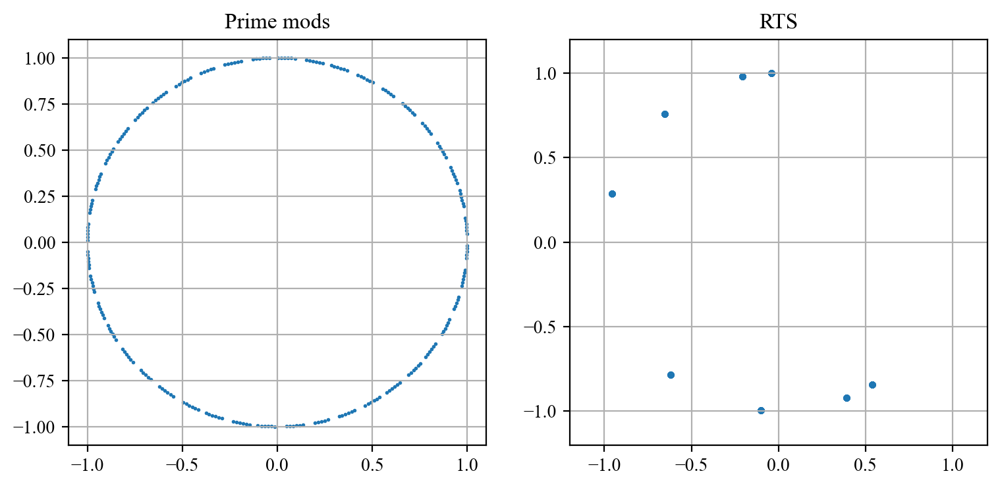

In [3]:
import matplotlib.pyplot as plt
import numpy as np
plt.rc('font',family='Times New Roman')

fig, ax = plt.subplots(1,2,dpi=200,figsize = (9,4))
prime_root = 3
prime_mods = np.array([prime_root**i%prime_no for i in range(1, prime_no)])
n = 8
rt = prime_root ** ((prime_no - 1) // n) % prime_no
rts = np.array([rt**i%prime_no for i in range(1, prime_no)])
sorted(prime_mods)
ax[0].scatter(x = np.cos(prime_mods), y = - np.sin(prime_mods), s = 1)
ax[0].grid()
ax[0].set_title('Prime mods')
ax[1].set_title('RTS')
ax[1].scatter(x = np.cos(rts), y = - np.sin(rts), s = 7)
ax[1].set_xlim([-1.2,1.2])
ax[1].set_ylim([-1.2,1.2])
ax[1].grid()


In [4]:
import random

class RandomFlipper:
    def __init__(self, rand_prob = 0.1):
        self.flips = 0
        self.prob = rand_prob
    def flip_random_bit(self, n):
        binary = bin(n)[2:]
        index = random.randint(0, len(binary) - 1)
        flipped = binary[:index] + ('0' if binary[index] == '1' else '1') + binary[index + 1:]
        #print("{} --> {}".format(binary, flipped))

        self.flips += 1
        return int(flipped, 2)

    def randomize(self, n):
        if random.random() < self.prob:
            #print("---Error Flip Occurs---")
            return self.flip_random_bit(n)
        else:
            return n


In [5]:
def randomized_ntt(seq, prime, inverse=False, rand_prob = 0.1, log = True):
    flipper = RandomFlipper(rand_prob = rand_prob)
    """Utility function for the Number Theoretic Transform"""

    if not iterable(seq):
        raise TypeError("Expected a sequence of integer coefficients "
                        "for Number Theoretic Transform")

    p = as_int(prime)
    if not isprime(p):
        raise ValueError("Expected prime modulus for "
                        "Number Theoretic Transform")

    a = [as_int(x) % p for x in seq]

    n = len(a)
    if n < 1:
        return a

    b = n.bit_length() - 1
    if n&(n - 1):
        b += 1
        n = 2**b

    if (p - 1) % n:
        raise ValueError("Expected prime modulus of the form (m*2**k + 1)")

    a += [0]*(n - len(a))
    for i in range(1, n):
        j = int(ibin(i, b, str=True)[::-1], 2)
        if i < j:
            a[i], a[j] = a[j], a[i]
    pr = primitive_root(p)
    rt = pow(pr, (p - 1) // n, p)
    if inverse:
        rt = pow(rt, p - 2, p)

    w = [1]*(n // 2)
    for i in range(1, n // 2):
        w[i] = w[i - 1]*rt % p
    if log:
        print("PM: ", pr)
        print("RT: ", rt)
        print("W: ", w)
    h = 2
    while h <= n:
        hf, ut = h // 2, n // h
        for i in range(0, n, h):
            for j in range(hf):
                if log: print("a in iteration", a)
                u, v = a[i + j], a[i + j + hf]*w[ut * j]
                
                a[i + j] = (u + v) % p
                if log: print("Operating a{} = (a{} + a{}w{})mod p = {}".format((i+j),(i+j),(i+j+hf),(ut*j),a[i+j]))
                a[i + j] = flipper.randomize(a[i + j])
                a[i + j + hf] = (u - v) % p
                if log: print("Operating a{} = (a{} - a{}w{})mod p = {}".format((i+j+hf),(i+j),(i+j+hf),(ut*j),a[i+j+hf]))
                a[i + j + hf] = flipper.randomize(a[i + j + hf])
                
        h *= 2
    
    if inverse:
        rv = pow(n, p - 2, p)
        a = [x*rv % p for x in a]
    if log:
        print("--------------------------------------------------------------------------------")
        print("Flip occurs {} times".format(flipper.flips))
        print("--------------------------------------------------------------------------------")
    return a


In [6]:
# sequence
seq = [15, 21, 13, 44, 17]

prime_no = 257

print("P:", prime_no)
print("Original Sequence: ",seq)
# ntt
ntt_seq = randomized_ntt(seq, prime_no)
print("NTT : ", ntt_seq)

# inv_ntt_seq = randmoized_ntt(ntt_seq, prime_no, inverse=True)
# intt_seq = intt(ntt_seq, prime_no)
# print("INTT : ", inv_ntt_seq)

P: 257
Original Sequence:  [15, 21, 13, 44, 17]
PM:  3
RT:  64
W:  [1, 64, 241, 4]
a in iteration [15, 17, 13, 0, 21, 0, 44, 0]
Operating a0 = (a0 + a1w0)mod p = 32
Operating a1 = (a0 - a1w0)mod p = 255
a in iteration [34, 255, 13, 0, 21, 0, 44, 0]
Operating a2 = (a2 + a3w0)mod p = 13
Operating a3 = (a2 - a3w0)mod p = 13
a in iteration [34, 255, 13, 13, 21, 0, 44, 0]
Operating a4 = (a4 + a5w0)mod p = 21
Operating a5 = (a4 - a5w0)mod p = 21
a in iteration [34, 255, 13, 13, 21, 21, 44, 0]
Operating a6 = (a6 + a7w0)mod p = 44
Operating a7 = (a6 - a7w0)mod p = 44
a in iteration [34, 255, 13, 13, 21, 21, 12, 44]
Operating a0 = (a0 + a2w0)mod p = 47
Operating a2 = (a0 - a2w0)mod p = 21
a in iteration [47, 255, 21, 13, 21, 21, 12, 44]
Operating a1 = (a1 + a3w2)mod p = 47
Operating a3 = (a1 - a3w2)mod p = 206
a in iteration [47, 47, 21, 206, 21, 21, 12, 44]
Operating a4 = (a4 + a6w0)mod p = 33
Operating a6 = (a4 - a6w0)mod p = 9
a in iteration [47, 47, 21, 206, 33, 21, 9, 44]
Operating a5 = (a

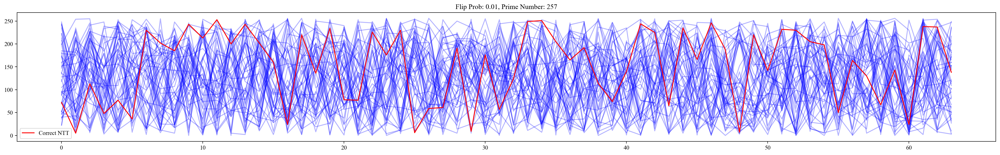

In [7]:
seq = np.random.randint(0, 1000, size = [50])
fig, ax = plt.subplots(dpi=200, figsize = [30, 4])
prob = 0.01
epochs = 50
for _ in range(epochs):
    ax.plot(randomized_ntt(seq,prime_no, log = False), alpha = 0.3, c = 'blue')
ax.plot(number_theoretic_transform(seq, prime_no, log = False), label="Correct NTT", c = 'red')

ax.set_title("Flip Prob: {}, Prime Number: {}".format(prob, prime_no))
ax.legend()

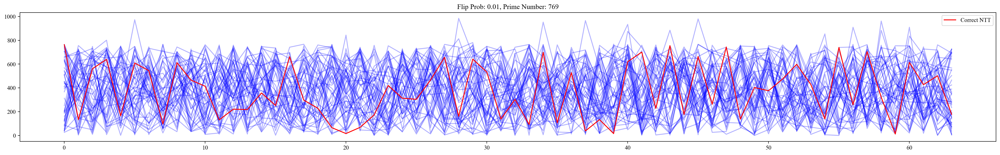

In [8]:
seq = np.random.randint(0, 1000, size = [50])
fig, ax = plt.subplots(dpi=200, figsize = [30, 4])
prob = 0.01
epochs = 50
prime_no = 3*2**8 + 1
for _ in range(epochs):
    ax.plot(randomized_ntt(seq,prime_no, log = False), alpha = 0.3, c = 'blue')
ax.plot(number_theoretic_transform(seq, prime_no, log = False), label="Correct NTT", c = 'red')

ax.set_title("Flip Prob: {}, Prime Number: {}".format(prob, prime_no))
ax.legend()

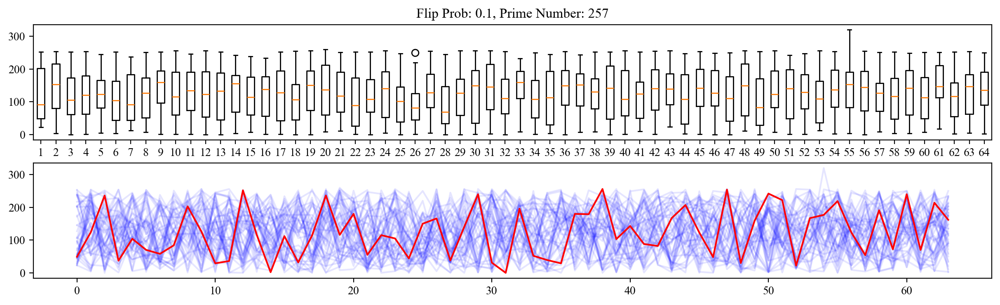

In [9]:
import numpy as np
import matplotlib.pyplot as plt

seq = np.random.randint(0, 1000, size=[50])
prob = 0.1
epochs = 50
prime_no = 2**8 + 1

# Create a list to store the data for the box plot
samples = []

for _ in range(epochs):
    samples.append(randomized_ntt(seq, prime_no, log=False))

# Create a box plot instead of a line plot
fig, ax = plt.subplots(2,dpi=200, figsize=[15, 4])
samples = np.array(samples).T
ax[0].boxplot(samples.T)
ax[1].plot(samples, alpha = 0.1, c = 'blue')
ax[1].plot(number_theoretic_transform(seq, prime_no, log = False), label="Correct NTT", c = 'red')

ax[0].set_title("Flip Prob: {}, Prime Number: {}".format(prob, prime_no))
plt.show()


In [10]:
samples.shape

(64, 50)

In [11]:
len(samples[0])

50

### Correctness Check

In [12]:
for i in range(60):
    if isprime(3*2**i+1):
        print(i)

1
2
5
6
8
12
18
30
36
41


In [13]:
def ntt(x, pm, log=True): return number_theoretic_transform(x, pm, log=log)
def intt(x, pm, log=True): return number_theoretic_transform(x, pm, log=log, inverse=True)
pm = 3*2**41+1
print('PM:',pm)
seq_a = [0,479,2736,3593,1]
seq_b = [7,50,132,35554,0]
ntt_a = ntt(seq_a, pm, log=False)
ntt_b = ntt(seq_b, pm, log=False)
ntt_ab = [ntt_a[i] * ntt_b[i] for i in range(len(ntt_a))]
ntt_a, ntt_b, ntt_ab

PM: 6597069766657


([6809,
  646455362748,
  386777923209,
  4046323344506,
  6597069765322,
  5080291639050,
  6210291837978,
  3421069187006],
 [35743,
  4074374740751,
  1808272899445,
  5644075318987,
  6597069731192,
  252747997648,
  4788796866962,
  3222941475956],
 [243374087,
  2633901401003476162943748,
  699400036642453988719005,
  22837753721367246643935422,
  43521329263367677063323824,
  1284033539237763464954400,
  29739826096628726925082836,
  11025905774916710616627736])

In [14]:
intt(ntt_ab, pm, log=False)

[0, 3353, 43102, 225179, 17571175, 97750070, 127745654, 35554]

In [15]:
import  numpy.polynomial.polynomial as poly
true_res = poly.polymul(seq_a,seq_b)
true_res

array([0.00000000e+00, 3.35300000e+03, 4.31020000e+04, 2.25179000e+05,
       1.75711750e+07, 9.77500700e+07, 1.27745654e+08, 3.55540000e+04])

In [16]:
def ntt_poly_mul(seq_a, seq_b, pm = 65537, flip_prob = 0):
    ntt_a = randomized_ntt(seq_a, pm, log=False, rand_prob=flip_prob)
    ntt_b = randomized_ntt(seq_b, pm, log=False, rand_prob=flip_prob)
    return randomized_ntt([ntt_a[i] * ntt_b[i] for i in range(len(ntt_a))], pm, log=False, inverse = True, rand_prob = flip_prob)

In [17]:
ntt_poly_mul(seq_a,seq_b)

[0, 3353, 43102, 28568, 7259, 34403, 14041, 35554]

### Multi-layer Test

In [18]:
def multi_ntt_rand_seq(seqs, pm = 3 * 2**41 + 1, flip_prob = 0):
    assert np.max(seqs) < pm
    #seqs = np.random.randint(scale, size = [layers_count+1, seq_len])
    #print("Datashape", seqs.shape)
    temp = seqs[0]
    for i in range(1,len(seqs)):
        temp = ntt_poly_mul(temp, seqs[i], pm=pm, flip_prob=flip_prob)
        #print('Mult ', i+1)
    return temp


In [19]:
def test_multi_layers(layers, pm, scale, flip_prob, draw = True):
    polynominals = np.random.randint(200, size = [5, 50])
    epochs = 50
    samples = []
    
    for _ in range(epochs):
        res = multi_ntt_rand_seq(polynominals, pm, flip_prob= flip_prob)
        samples.append(res)
    samples = np.array(samples)
    correct = multi_ntt_rand_seq(polynominals,  pm, flip_prob = 0)
    if draw:
        fig, ax = plt.subplots(2,dpi=200, figsize=(15,6))
        ax[0].plot(samples.T, alpha=0.3, c='blue')
        ax[0].plot(correct, c='Red')
        ax[1].boxplot(samples)
        ax[0].set_title('Layers:{} PM:{} Scale:{} Flip_prob:{}'.format(layers, pm, scale, flip_prob))
        plt.tight_layout()
        plt.show()
    return samples, np.array(correct)

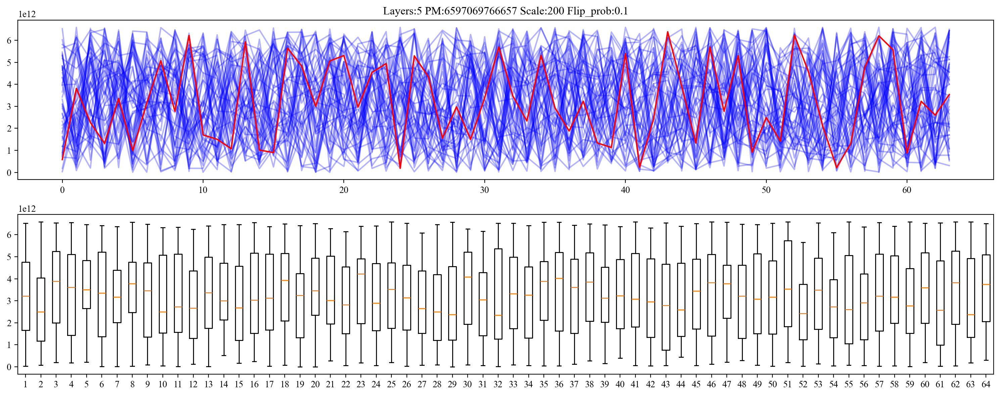

(array([[3654754686581, 6137038087492, 5130420632272, ..., 1922858763580,
         6316926514417, 1077409446757],
        [1556303080375, 3772005170455, 2242986134360, ..., 4416527131014,
         4450285803690, 6447538960387],
        [5312442796517, 1360998985281, 3812480580784, ..., 2708494972016,
         3975270360871,  586316943022],
        ...,
        [2644412249791,  343108783070, 4715148972478, ..., 1474784638963,
         2464003074857, 4900859153443],
        [1843478050442, 3523197971493, 5179954516895, ..., 4334798746026,
         5034850247106, 4549719360016],
        [ 816515575180, 1764781615273, 1335499710048, ..., 2585511228700,
          416835701391, 3290741316315]]),
 array([ 581883218705, 3815991711155, 2258762893111, 1319039712944,
        3359541905374,  990728456023, 3153922208766, 5078732134330,
        2773984191665, 6219288369410, 1702619722206, 1504806317744,
        1075829389077, 5936126473122, 1016370213051,  901926131587,
        5645373081159, 482840

In [20]:
test_multi_layers(5, 3 * 2**41 + 1, 200, 0.1)

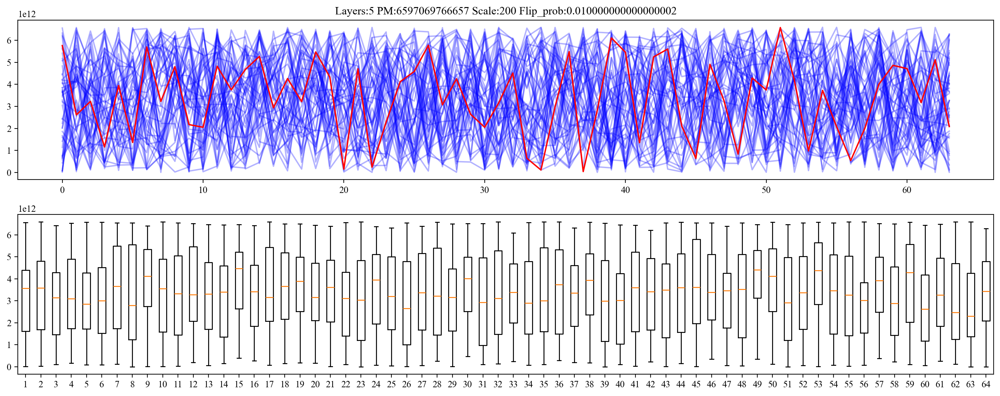

(array([[  13640139467, 6119932472378, 1541350409302, ..., 2408058199818,
         6041529150378, 3993292305379],
        [3668683270581,  633919618465, 1354130363311, ..., 1167488987298,
         2559188633005, 2914477859832],
        [3287013980263,  941396842231, 1331990180174, ..., 6341802187625,
         4929367344535, 2080687745731],
        ...,
        [5743417929298, 4202649608344, 3508044879959, ..., 1925196064266,
         2189791441505, 4415944449129],
        [ 768831277452, 2084530839388, 2416655710293, ..., 1141095759371,
         1872119426293, 1568542388654],
        [4037281819719, 4148407885162, 6423984280361, ..., 4630924659742,
         4048270881303,  953831005466]]),
 array([5764657765868, 2615591990349, 3227170091856, 1157666520038,
        3948221324424, 1361121882842, 5701321429756, 3226473245654,
        4806153991376, 2172452349867, 2051982280949, 4825748783147,
        3750999677332, 4675635148409, 5270675047839, 2934987803708,
        4265181499118, 321789

In [21]:
test_multi_layers(5, 3 * 2**41 + 1, 200, 0.1**2)

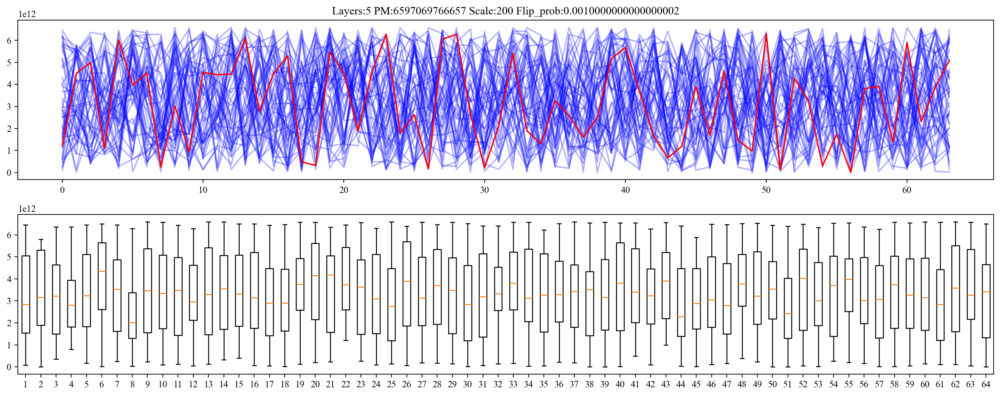

(array([[3351382827346, 2634606403085, 4273276387816, ..., 5507614709277,
         6483373170922, 4240769161976],
        [1799353334242, 5454066142490, 6366407954084, ..., 3414279076357,
         1170654725664, 2016048043879],
        [4317639449257, 2552918709257, 1470388818552, ..., 1954377466435,
         2123634306597,  851404090799],
        ...,
        [3211692237158,  853072570079,  689435559195, ..., 4477624787517,
         6326114598444, 3737220446400],
        [1155625762718, 5601922016807, 4992886962321, ..., 5000401390109,
         2303676666789, 2576230942490],
        [ 589676329725, 5334391660017, 6141177023198, ..., 5789835299440,
         2163974568538, 1153210901853]]),
 array([1205741834299, 4509215321175, 4992204999536, 1081192069118,
        6020910733896, 3963905626293, 4515779084976,  240320626555,
        3015608619294,  952219520307, 4545754217308, 4444910929853,
        4463619866500, 6097216099221, 2784270334391, 4483850512934,
        5295359929679,  47271

In [22]:
test_multi_layers(5, 3 * 2**41 + 1, 200, 0.1**3)

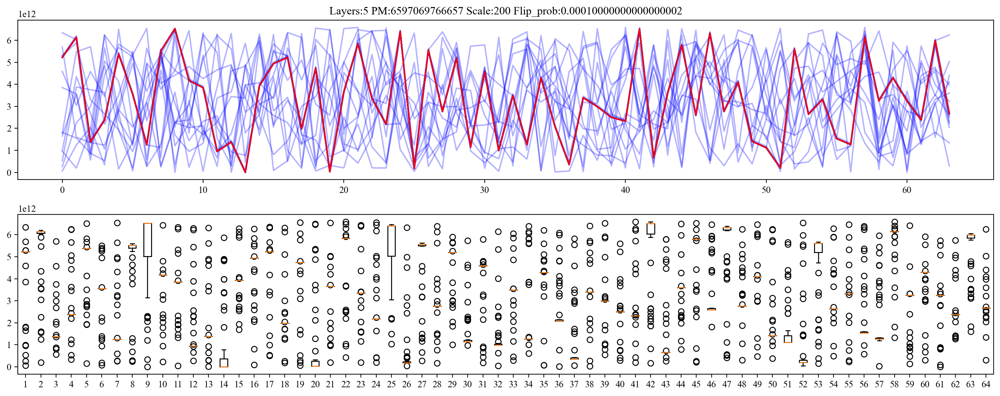

(array([[5693581657222, 1593246867016, 1355038888469, ..., 2300400652224,
         5767675369280, 2502910629203],
        [5224731121902, 6139311330065, 1374473210801, ..., 2383365014650,
         5988404141976, 2666403463963],
        [5224731121902, 6139311330065, 1374473210801, ..., 2383365014650,
         5988404141976, 2666403463963],
        ...,
        [5224731121902, 6139311330065, 1374473210801, ..., 2383365014650,
         5988404141976, 2666403463963],
        [ 258517327994, 2256997136944, 2983862092003, ..., 5074022134535,
         3485826862737, 5032492874530],
        [5224731121902, 6139311330065, 1374473210801, ..., 2383365014650,
         5988404141976, 2666403463963]]),
 array([5224731121902, 6139311330065, 1374473210801, 2374780486429,
        5380801046773, 3545726914719, 1246934076934, 5518321913205,
        6529365407172, 4171003380188, 3851142755995,  948004614132,
        1379673195337,    1515450204, 3933017813127, 4939867829236,
        5224387129213, 197491

In [23]:
test_multi_layers(5, 3 * 2**41 + 1, 200, 0.1**4)

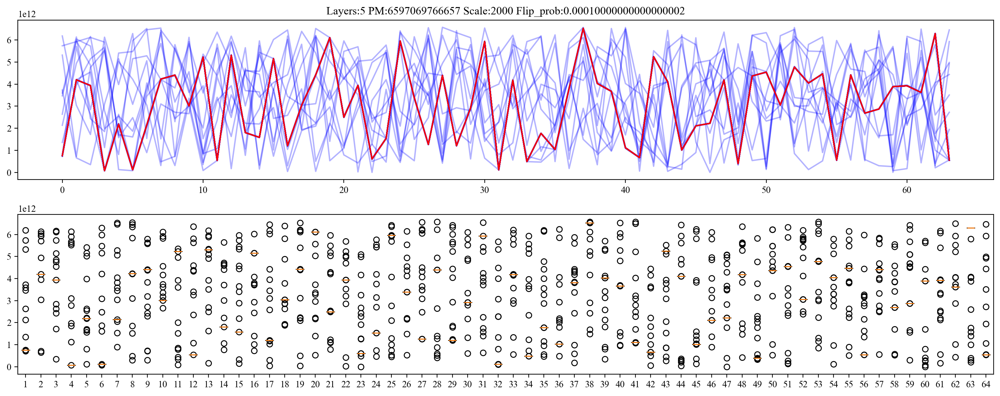

(array([[ 754085984329, 4197681987343, 3936671260962, ..., 3621725138389,
         6293837254221,  551213617941],
        [2133373884499, 4938276736810, 6159652970816, ..., 2881130388922,
         4070855544367, 4437093393161],
        [ 754085984329, 4197681987343, 3936671260962, ..., 3621725138389,
         6293837254221,  551213617941],
        ...,
        [ 754085984329, 4197681987343, 3936671260962, ..., 3621725138389,
         6293837254221,  551213617941],
        [ 754085984329, 4197681987343, 3936671260962, ..., 3621725138389,
         6293837254221,  551213617941],
        [ 754085984329, 4197681987343, 3936671260962, ..., 3621725138389,
         6293837254221,  551213617941]]),
 array([ 754085984329, 4197681987343, 3936671260962,   75067051416,
        2189074875024,  116417606706, 2145232152318, 4229423207762,
        4410647924330, 3007776891699, 5229430343527,  540118103245,
        5307195055356, 1802470463036, 1585878188248, 5157758122986,
        1207382031658, 304273

In [24]:
test_multi_layers(5, 3 * 2**41 + 1, 2000, 0.1**4)

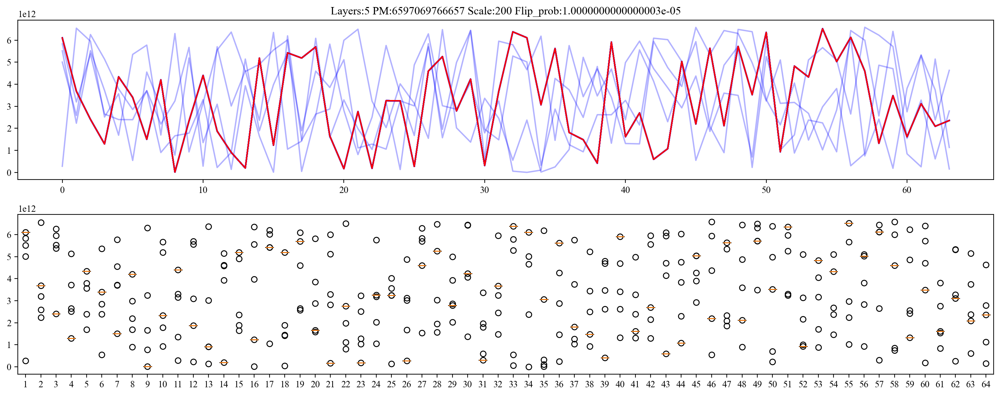

(array([[ 278024705726, 6544774491029, 5953682633379, ...,  254885860143,
         5144110259581, 1132378849302],
        [5006108368926, 2585002942267, 6256553697834, ..., 5314169036725,
         3741727567386,  156221690452],
        [6105619996696, 3684514570011, 2408263000602, ..., 3115145781161,
         2092460125701, 2355244945985],
        ...,
        [6105619996696, 3684514570011, 2408263000602, ..., 3115145781161,
         2092460125701, 2355244945985],
        [6105619996696, 3684514570011, 2408263000602, ..., 3115145781161,
         2092460125701, 2355244945985],
        [6105619996696, 3684514570011, 2408263000602, ..., 3115145781161,
         2092460125701, 2355244945985]]),
 array([6105619996696, 3684514570011, 2408263000602, 1290514900935,
        4338320875276, 3403554136273, 1501640225102, 4201166080762,
          12343151824, 2332754297621, 4402066796355, 1872625618754,
         907377067344,  196098687681, 5189151224713, 1232797522499,
        5426760570436, 519020

In [25]:
test_multi_layers(5, 3 * 2**41 + 1, 200, 0.1**5)

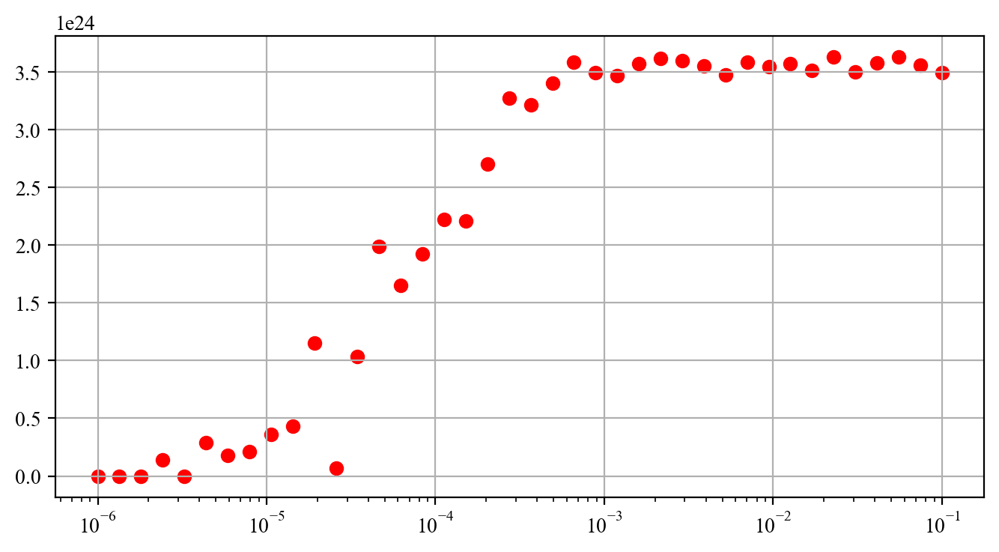

In [26]:
layers = [2,3,4,5]
pm = 3 * 2**41 + 1
scale = [10, 100, 1000, 2000]
flip_prob = np.logspace(-6, -1, 40)

variances = []
fig, ax = plt.subplots(dpi=200, figsize=(8,4))
ax.grid()
ax.set_xscale('log')
for i in range(len(flip_prob)):
    sample,_ = test_multi_layers(4, pm, 1000, flip_prob[i], draw=False)
    sample_var = np.var(sample, axis=0)
    ax.scatter(x = flip_prob[i], y = np.mean(sample_var), c = 'Red')

In [27]:
np.logspace(-6, -1, 20), np.arange(10,1000,20)

(array([1.00000000e-06, 1.83298071e-06, 3.35981829e-06, 6.15848211e-06,
        1.12883789e-05, 2.06913808e-05, 3.79269019e-05, 6.95192796e-05,
        1.27427499e-04, 2.33572147e-04, 4.28133240e-04, 7.84759970e-04,
        1.43844989e-03, 2.63665090e-03, 4.83293024e-03, 8.85866790e-03,
        1.62377674e-02, 2.97635144e-02, 5.45559478e-02, 1.00000000e-01]),
 array([ 10,  30,  50,  70,  90, 110, 130, 150, 170, 190, 210, 230, 250,
        270, 290, 310, 330, 350, 370, 390, 410, 430, 450, 470, 490, 510,
        530, 550, 570, 590, 610, 630, 650, 670, 690, 710, 730, 750, 770,
        790, 810, 830, 850, 870, 890, 910, 930, 950, 970, 990]))

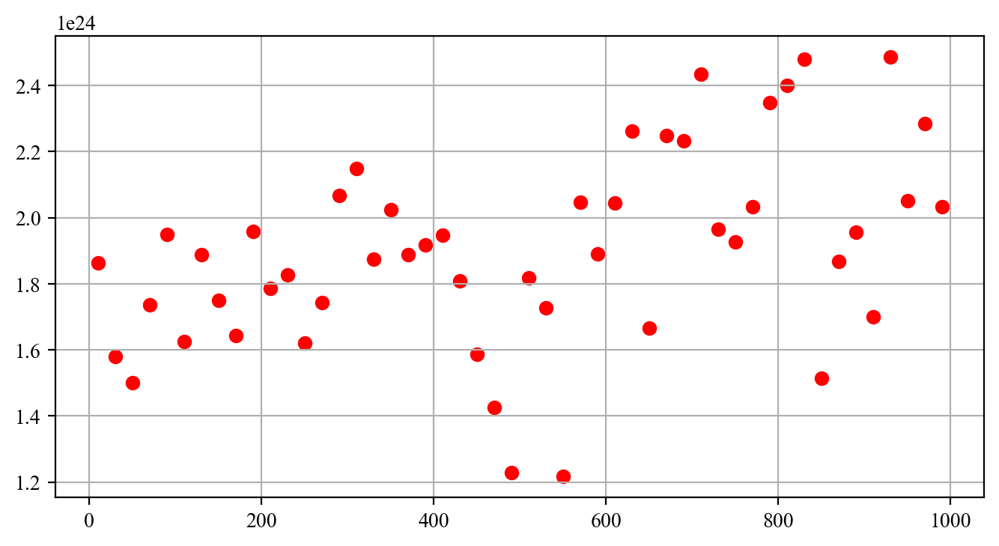

In [28]:
layers = [2,3,4,5]
pm = 3 * 2**41 + 1
scale = np.arange(10,1000,20)
flip_prob = np.logspace(-6, -1, 40)

variances = []
fig, ax = plt.subplots(dpi=200, figsize=(8,4))
ax.grid()
#ax.set_xscale('log')
for sca in scale:
    sample,_ = test_multi_layers(4, pm, sca, 0.1**4, draw=False)
    sample_var = np.var(sample, axis=0)
    ax.scatter(x = sca, y = np.mean(sample_var), c = 'Red')

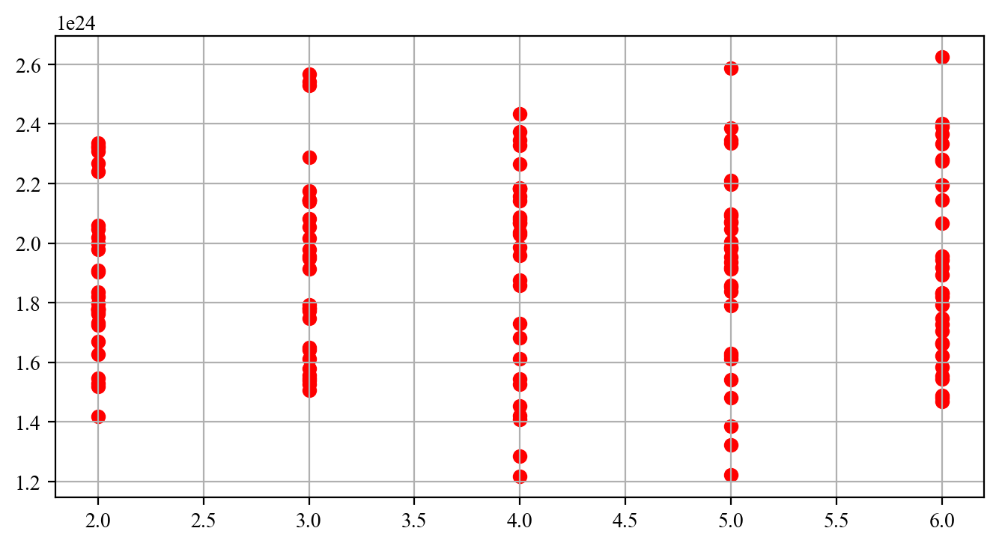

In [29]:
layers = [2,3,4,5,6]
pm = 3 * 2**41 + 1
scale = np.arange(10,1000,20)
flip_prob = np.logspace(-6, -1, 40)

variances = []
fig, ax = plt.subplots(dpi=200, figsize=(8,4))
ax.grid()
#ax.set_xscale('log')
for lay in layers:
    for _ in range(30):
        sample,_ = test_multi_layers(lay, pm, 100, 0.1**4, draw=False)
        sample_var = np.var(sample, axis=0)
        ax.scatter(x = lay, y = np.mean(sample_var), c = 'Red')

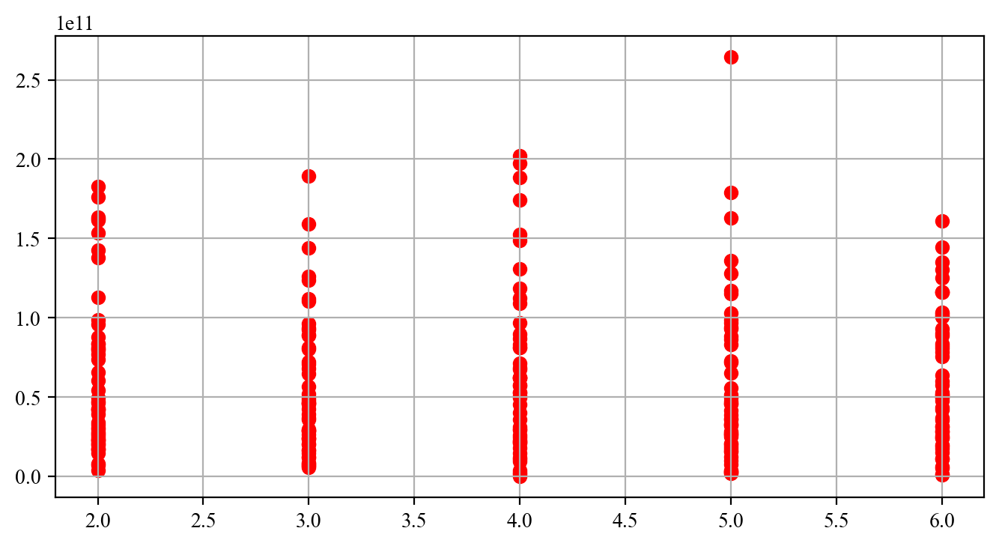

In [30]:
layers = [2,3,4,5,6]
pm = 3 * 2**41 + 1
scale = np.arange(10,1000,20)
flip_prob = np.logspace(-6, -1, 40)

variances = []
fig, ax = plt.subplots(dpi=200, figsize=(8,4))
ax.grid()
#ax.set_xscale('log')
for lay in layers:
    for _ in range(50):
        sample, correct = test_multi_layers(lay, pm, 100, 0.1**4, draw=False)
        sample_mean = np.mean(sample, axis=0)
        ax.scatter(x = lay, y = np.abs(np.mean(correct - sample_mean)), c = 'Red')